In [1]:

import json
import random
from urllib.request import urlopen
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objs as go
import plotly.figure_factory as ff
import calmap
import folium

cnf = '#393e46' # confirmed - grey
dth = '#ff2e63' # death - red
rec = '#21bf73' # recovered - cyan
act = '#fe9801' # active case - yellow

from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()   

import warnings
warnings.filterwarnings('ignore')

from IPython.display import Javascript
from IPython.core.display import display
from IPython.core.display import HTML


In [2]:

full_table = pd.read_csv('covid_19_data.csv', parse_dates=['ObservationDate'])
full_table.head()


,SNo,ObservationDate,Province/State,Country/Region,Last Update,Confirmed,Deaths,Recovered
0,1,2020-01-22,Anhui,Mainland China,1/22/2020 17:00,1.0,0.0,0.0
1,2,2020-01-22,Beijing,Mainland China,1/22/2020 17:00,14.0,0.0,0.0
2,3,2020-01-22,Chongqing,Mainland China,1/22/2020 17:00,6.0,0.0,0.0
3,4,2020-01-22,Fujian,Mainland China,1/22/2020 17:00,1.0,0.0,0.0
4,5,2020-01-22,Gansu,Mainland China,1/22/2020 17:00,0.0,0.0,0.0


In [3]:

# Кейсы
cases = ['Confirmed', 'Deaths', 'Recovered', 'Active']

# Заражённые(active) = Подтверждённые - умершие - вылечившиеся
full_table['Active'] = full_table['Confirmed'] - full_table['Deaths'] - full_table['Recovered']

# поменяем "Континентальный Китай" на "Китай" для удобства
full_table['Country/Region'] = full_table['Country/Region'].replace('Mainland China', 'China')

# заполняем пустые строки
full_table[['Province/State']] = full_table[['Province/State']].fillna('')
full_table[cases] = full_table[cases].fillna(0)

full_table.head()


,SNo,ObservationDate,Province/State,Country/Region,Last Update,Confirmed,Deaths,Recovered,Active
0,1,2020-01-22,Anhui,China,1/22/2020 17:00,1.0,0.0,0.0,1.0
1,2,2020-01-22,Beijing,China,1/22/2020 17:00,14.0,0.0,0.0,14.0
2,3,2020-01-22,Chongqing,China,1/22/2020 17:00,6.0,0.0,0.0,6.0
3,4,2020-01-22,Fujian,China,1/22/2020 17:00,1.0,0.0,0.0,1.0
4,5,2020-01-22,Gansu,China,1/22/2020 17:00,0.0,0.0,0.0,0.0


In [4]:

# Кейсы на корабле
ship = full_table[full_table['Province/State'].str.contains('Grand Princess')|full_table['Country/Region'].str.contains('Cruise Ship')]

# Китай и остальные
china = full_table[full_table['Country/Region']=='China']
row = full_table[full_table['Country/Region']!='China']

# Последние данные
full_latest = full_table[full_table['ObservationDate'] == max(full_table['ObservationDate'])].reset_index()
china_latest = full_latest[full_latest['Country/Region']=='China']
row_latest = full_latest[full_latest['Country/Region']!='China']

# Последние данные (сгруппированные)
full_latest_grouped = full_latest.groupby('Country/Region')['Confirmed', 'Deaths', 'Recovered', 'Active'].sum().reset_index()
china_latest_grouped = china_latest.groupby('Province/State')['Confirmed', 'Deaths', 'Recovered', 'Active'].sum().reset_index()
row_latest_grouped = row_latest.groupby('Country/Region')['Confirmed', 'Deaths', 'Recovered', 'Active'].sum().reset_index()

full_latest.head()


,index,SNo,ObservationDate,Province/State,Country/Region,Last Update,Confirmed,Deaths,Recovered,Active
0,7014,7015,2020-03-20,Hubei,China,2020-03-20T07:43:02,67800.0,3133.0,58382.0,6285.0
1,7015,7016,2020-03-20,,Italy,2020-03-20T17:43:03,47021.0,4032.0,4440.0,38549.0
2,7016,7017,2020-03-20,,Spain,2020-03-20T17:43:03,20410.0,1043.0,1588.0,17779.0
3,7017,7018,2020-03-20,,Germany,2020-03-20T20:13:15,19848.0,67.0,180.0,19601.0
4,7018,7019,2020-03-20,,Iran,2020-03-20T15:13:21,19644.0,1433.0,6745.0,11466.0


In [5]:

temp = full_table.groupby(['Country/Region', 'Province/State'])['Confirmed', 'Deaths', 'Recovered', 'Active'].max()
temp.style.background_gradient(cmap='Reds')


In [6]:

temp = full_table.groupby('ObservationDate')['Confirmed', 'Deaths', 'Recovered', 'Active'].sum().reset_index()
temp = temp[temp['ObservationDate']==max(temp['ObservationDate'])].reset_index(drop=True)
temp.style.background_gradient(cmap='Pastel1')


,ObservationDate,Confirmed,Deaths,Recovered,Active
0,2020-03-20 00:00:00,272167.000000,11299.000000,87403.000000,173465.000000


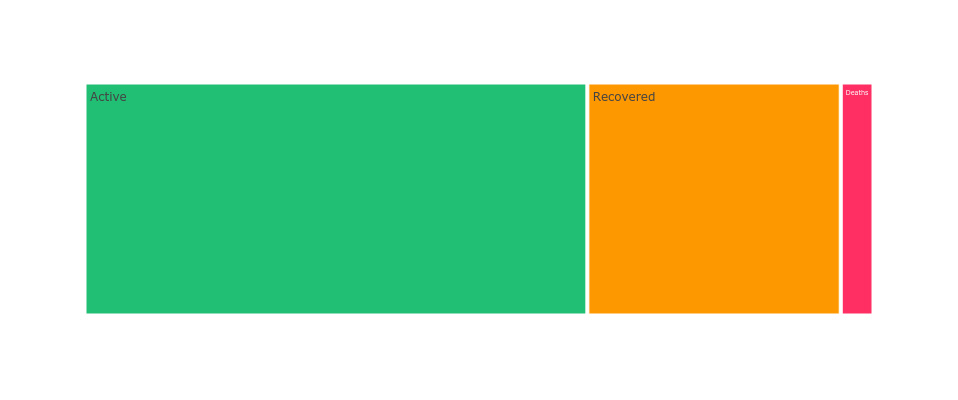

In [7]:

tm = temp.melt(id_vars="ObservationDate", value_vars=['Active', 'Deaths', 'Recovered'])
fig = px.treemap(tm, path=["variable"], values="value", height=400, width=600,
                 color_discrete_sequence=[rec, act, dth])
fig.show()


In [8]:

temp_f = full_latest_grouped.sort_values(by='Confirmed', ascending=False)
temp_f = temp_f.reset_index(drop=True)
temp_f.style.background_gradient(cmap='Reds')


,Country/Region,Confirmed,Deaths,Recovered,Active
0,China,80977.000000,3249.000000,71158.000000,6570.000000
1,Italy,47021.000000,4032.000000,4440.000000,38549.000000
2,Spain,20410.000000,1043.000000,1588.000000,17779.000000
3,Germany,19848.000000,67.000000,180.000000,19601.000000
4,Iran,19644.000000,1433.000000,6745.000000,11466.000000
5,US,19101.000000,244.000000,147.000000,18710.000000
6,France,12632.000000,450.000000,12.000000,12170.000000
7,South Korea,8652.000000,94.000000,1540.000000,7018.000000
8,Switzerland,5294.000000,54.000000,15.000000,5225.000000
9,UK,4014.000000,178.000000,67.000000,3769.000000


In [9]:

temp_flg = temp_f[temp_f['Deaths']>0][['Country/Region', 'Deaths']]
temp_flg.sort_values('Deaths', ascending=False).reset_index(drop=True).style.background_gradient(cmap='Reds')


,Country/Region,Deaths
0,Italy,4032.000000
1,China,3249.000000
2,Iran,1433.000000
3,Spain,1043.000000
4,France,450.000000
5,US,244.000000
6,UK,178.000000
7,Netherlands,107.000000
8,South Korea,94.000000
9,Germany,67.000000


In [10]:

temp = temp_f[temp_f['Recovered']==0][['Country/Region', 'Confirmed', 'Deaths', 'Recovered']]
temp.reset_index(drop=True).style.background_gradient(cmap='Reds')


,Country/Region,Confirmed,Deaths,Recovered
0,Luxembourg,484.000000,4.000000,0.000000
1,Ecuador,367.000000,5.000000,0.000000
2,Turkey,359.000000,4.000000,0.000000
3,Slovenia,341.000000,1.000000,0.000000
4,South Africa,202.000000,0.000000,0.000000
5,Panama,137.000000,1.000000,0.000000
6,Slovakia,137.000000,1.000000,0.000000
7,Bulgaria,127.000000,3.000000,0.000000
8,Uruguay,94.000000,0.000000,0.000000
9,Costa Rica,89.000000,1.000000,0.000000


In [11]:

temp = row_latest_grouped[row_latest_grouped['Confirmed']==row_latest_grouped['Deaths']]
temp = temp[['Country/Region', 'Confirmed', 'Deaths']]
temp = temp.sort_values('Confirmed', ascending=False)
temp = temp.reset_index(drop=True)
temp.style.background_gradient(cmap='Reds')


,Country/Region,Confirmed,Deaths
0,Greenland,0.000000,0.000000
1,Guam,0.000000,0.000000
2,Guernsey,0.000000,0.000000
3,Jersey,0.000000,0.000000
4,Puerto Rico,0.000000,0.000000
5,Republic of the Congo,0.000000,0.000000
6,The Bahamas,0.000000,0.000000
7,The Gambia,0.000000,0.000000


In [12]:

temp = row_latest_grouped[row_latest_grouped['Confirmed']==
                          row_latest_grouped['Recovered']]
temp = temp[['Country/Region', 'Confirmed', 'Recovered']]
temp = temp.sort_values('Confirmed', ascending=False)
temp = temp.reset_index(drop=True)
temp.style.background_gradient(cmap='Greens')


,Country/Region,Confirmed,Recovered
0,Nepal,1.000000,1.000000
1,Greenland,0.000000,0.000000
2,Guam,0.000000,0.000000
3,Guernsey,0.000000,0.000000
4,Jersey,0.000000,0.000000
5,Puerto Rico,0.000000,0.000000
6,Republic of the Congo,0.000000,0.000000
7,The Bahamas,0.000000,0.000000
8,The Gambia,0.000000,0.000000


In [13]:

temp = row_latest_grouped[row_latest_grouped['Confirmed']==row_latest_grouped['Deaths']+
                          row_latest_grouped['Recovered']]
temp = temp[['Country/Region', 'Confirmed', 'Deaths', 'Recovered']]
temp = temp.sort_values('Confirmed', ascending=False)
temp = temp.reset_index(drop=True)
temp.style.background_gradient(cmap='Greens')


,Country/Region,Confirmed,Deaths,Recovered
0,Nepal,1.000000,0.000000,1.000000
1,Greenland,0.000000,0.000000,0.000000
2,Guam,0.000000,0.000000,0.000000
3,Guernsey,0.000000,0.000000,0.000000
4,Jersey,0.000000,0.000000,0.000000
5,Puerto Rico,0.000000,0.000000,0.000000
6,Republic of the Congo,0.000000,0.000000,0.000000
7,The Bahamas,0.000000,0.000000,0.000000
8,The Gambia,0.000000,0.000000,0.000000


In [14]:

temp_f = china_latest_grouped[['Province/State', 'Confirmed', 'Deaths', 'Recovered']]
temp_f = temp_f.sort_values(by='Confirmed', ascending=False)
temp_f = temp_f.reset_index(drop=True)
temp_f.style.background_gradient(cmap='Pastel1_r')


,Province/State,Confirmed,Deaths,Recovered
0,Hubei,67800.000000,3133.000000,58382.000000
1,Guangdong,1395.000000,8.000000,1323.000000
2,Henan,1273.000000,22.000000,1250.000000
3,Zhejiang,1234.000000,1.000000,1219.000000
4,Hunan,1018.000000,4.000000,1014.000000
5,Anhui,990.000000,6.000000,984.000000
6,Jiangxi,935.000000,1.000000,934.000000
7,Shandong,762.000000,7.000000,748.000000
8,Jiangsu,631.000000,0.000000,631.000000
9,Chongqing,576.000000,6.000000,570.000000


In [15]:

temp = china_latest_grouped[china_latest_grouped['Recovered']==0]
temp = temp[['Province/State', 'Confirmed', 'Deaths', 'Recovered']]
temp = temp.sort_values('Confirmed', ascending=False)
temp = temp.reset_index(drop=True)
temp.style.background_gradient(cmap='Pastel1_r')


,Province/State,Confirmed,Deaths,Recovered


In [16]:

temp = china_latest_grouped[china_latest_grouped['Confirmed']==
                          china_latest_grouped['Deaths']]
temp = temp[['Province/State', 'Confirmed', 'Deaths', 'Recovered']]
temp = temp.sort_values('Confirmed', ascending=False)
temp = temp.reset_index(drop=True)
temp.style.background_gradient(cmap='Greens')


,Province/State,Confirmed,Deaths,Recovered


In [17]:

temp = china_latest_grouped[china_latest_grouped['Confirmed']==
                          china_latest_grouped['Recovered']]
temp = temp[['Province/State', 'Confirmed','Deaths', 'Recovered']]
temp = temp.sort_values('Confirmed', ascending=False)
temp = temp.reset_index(drop=True)
temp.style.background_gradient(cmap='Greens')


,Province/State,Confirmed,Deaths,Recovered
0,Jiangsu,631.000000,0.000000,631.000000
1,Shanxi,133.000000,0.000000,133.000000
2,Ningxia,75.000000,0.000000,75.000000
3,Qinghai,18.000000,0.000000,18.000000
4,Tibet,1.000000,0.000000,1.000000


In [18]:

temp = china_latest_grouped[china_latest_grouped['Confirmed']==china_latest_grouped['Deaths']+
                            china_latest_grouped['Recovered']]
temp = temp[['Province/State', 'Confirmed', 'Deaths', 'Recovered']]
temp = temp.sort_values('Confirmed', ascending=False)
temp = temp.reset_index(drop=True)
temp.style.background_gradient(cmap='Greens')


,Province/State,Confirmed,Deaths,Recovered
0,Hunan,1018.000000,4.000000,1014.000000
1,Anhui,990.000000,6.000000,984.000000
2,Jiangxi,935.000000,1.000000,934.000000
3,Jiangsu,631.000000,0.000000,631.000000
4,Chongqing,576.000000,6.000000,570.000000
5,Guizhou,146.000000,2.000000,144.000000
6,Shanxi,133.000000,0.000000,133.000000
7,Jilin,93.000000,1.000000,92.000000
8,Xinjiang,76.000000,3.000000,73.000000
9,Inner Mongolia,75.000000,1.000000,74.000000


In [19]:
'''
m = folium.Map(location=[0, 0], tiles='cartodbpositron', min_zoom=1, max_zoom=4, zoom_start=1)
for i in range(0, len(full_latest)):
    folium.Circle(location=[full_latest.iloc[i]['Lat'],
                            full_latest.iloc[i]['Long']],
                  color='crimson',
                  tooltip = '<li><bold>Country : '+str(full_latest.iloc[i]['Country/Region'])+
                  '<li><bold>Province : '+str(full_latest.iloc[i]['Province/State'])+
                  '<li><bold>Confirmed : '+str(full_latest.iloc[i]['Confirmed'])+
                  '<li><bold>Deaths : '+str(full_latest.iloc[i]['Deaths'])+
                  '<li><bold>Recovered : '+str(full_latest.iloc[i]['Recovered']),
                  radius=int(full_latest.iloc[i]['Confirmed'])**1.1).add_to(m)
m
'''

"\nm = folium.Map(location=[0, 0], tiles='cartodbpositron', min_zoom=1, max_zoom=4, zoom_start=1)\nfor i in range(0, len(full_latest)):\n    folium.Circle(location=[full_latest.iloc[i]['Lat'],\n                            full_latest.iloc[i]['Long']],\n                  color='crimson',\n                  tooltip = '<li><bold>Country : '+str(full_latest.iloc[i]['Country/Region'])+\n                  '<li><bold>Province : '+str(full_latest.iloc[i]['Province/State'])+\n                  '<li><bold>Confirmed : '+str(full_latest.iloc[i]['Confirmed'])+\n                  '<li><bold>Deaths : '+str(full_latest.iloc[i]['Deaths'])+\n                  '<li><bold>Recovered : '+str(full_latest.iloc[i]['Recovered']),\n                  radius=int(full_latest.iloc[i]['Confirmed'])**1.1).add_to(m)\nm\n"

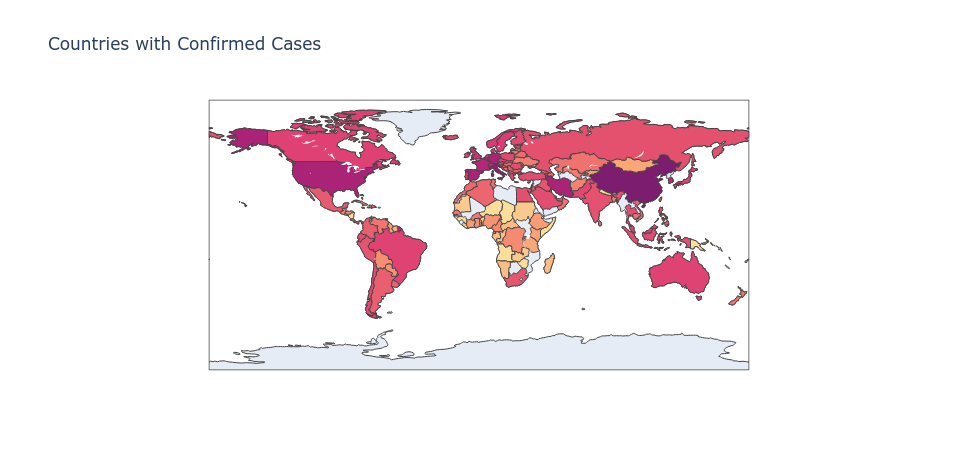

In [20]:

fig = px.choropleth(full_latest_grouped, locations="Country/Region", 
                    locationmode='country names', color=np.log(full_latest_grouped["Confirmed"]), 
                    hover_name="Country/Region", hover_data=['Confirmed'],
                    color_continuous_scale="Sunsetdark", 
                    title='Countries with Confirmed Cases')
fig.update(layout_coloraxis_showscale=False)
fig.show()


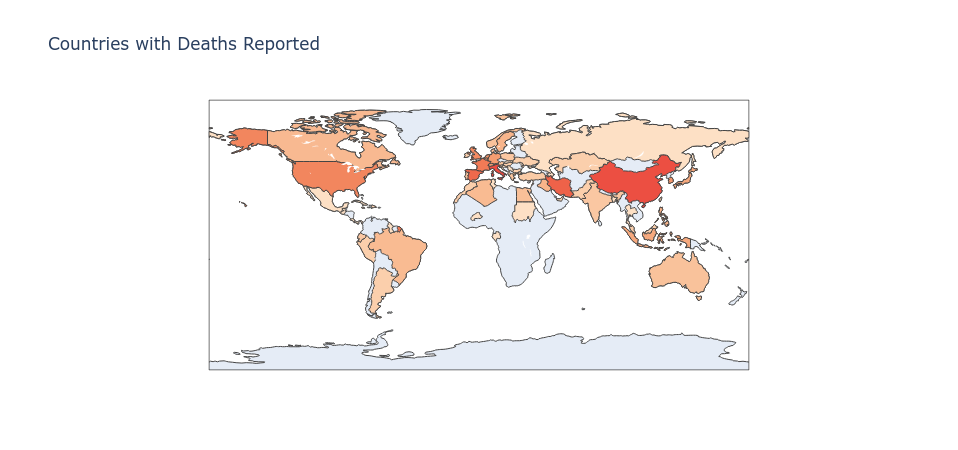

In [21]:

temp = full_latest_grouped[full_latest_grouped['Deaths']>0]
fig = px.choropleth(temp, 
                    locations="Country/Region", locationmode='country names',
                    color=np.log(temp["Deaths"]), hover_name="Country/Region", 
                    color_continuous_scale="Peach", hover_data=['Deaths'],
                    title='Countries with Deaths Reported')
fig.update(layout_coloraxis_showscale=False)
fig.show()


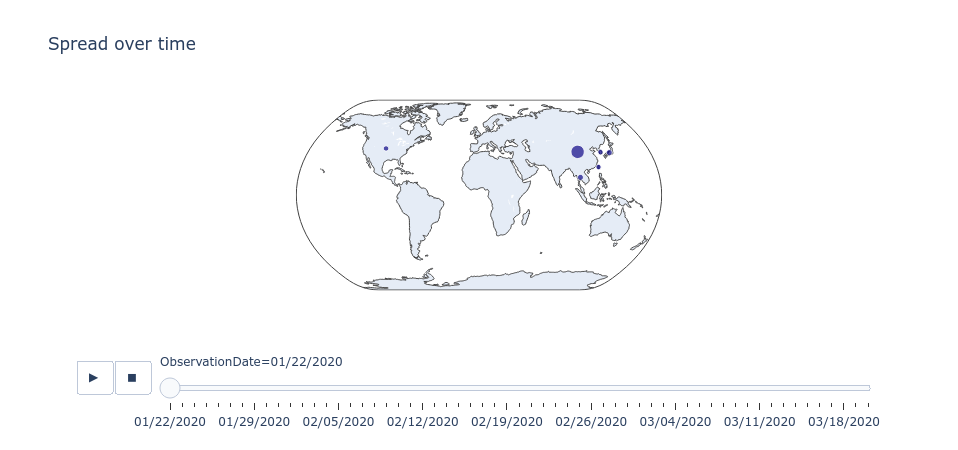

In [22]:

formated_gdf = full_table.groupby(['ObservationDate', 'Country/Region'])['Confirmed', 'Deaths', 'Recovered'].max()
formated_gdf = formated_gdf.reset_index()
formated_gdf['ObservationDate'] = pd.to_datetime(formated_gdf['ObservationDate'])
formated_gdf['ObservationDate'] = formated_gdf['ObservationDate'].dt.strftime('%m/%d/%Y')
formated_gdf['size'] = formated_gdf['Confirmed'].pow(0.3)

fig = px.scatter_geo(formated_gdf, locations="Country/Region", locationmode='country names', 
                     color="Confirmed", size='size', hover_name="Country/Region", 
                     range_color= [0, max(formated_gdf['Confirmed'])+2], 
                     projection="natural earth", animation_frame="ObservationDate", 
                     title='Spread over time')
fig.update(layout_coloraxis_showscale=False)
fig.show()


In [23]:

states = {
        'AK': 'Alaska',
        'AL': 'Alabama',
        'AR': 'Arkansas',
        'AS': 'American Samoa',
        'AZ': 'Arizona',
        'CA': 'California',
        'CO': 'Colorado',
        'CT': 'Connecticut',
        'DC': 'District of Columbia',
        'DE': 'Delaware',
        'FL': 'Florida',
        'GA': 'Georgia',
        'GU': 'Guam',
        'HI': 'Hawaii',
        'IA': 'Iowa',
        'ID': 'Idaho',
        'IL': 'Illinois',
        'IN': 'Indiana',
        'KS': 'Kansas',
        'KY': 'Kentucky',
        'LA': 'Louisiana',
        'MA': 'Massachusetts',
        'MD': 'Maryland',
        'ME': 'Maine',
        'MI': 'Michigan',
        'MN': 'Minnesota',
        'MO': 'Missouri',
        'MP': 'Northern Mariana Islands',
        'MS': 'Mississippi',
        'MT': 'Montana',
        'NA': 'National',
        'NC': 'North Carolina',
        'ND': 'North Dakota',
        'NE': 'Nebraska',
        'NH': 'New Hampshire',
        'NJ': 'New Jersey',
        'NM': 'New Mexico',
        'NV': 'Nevada',
        'NY': 'New York',
        'OH': 'Ohio',
        'OK': 'Oklahoma',
        'OR': 'Oregon',
        'PA': 'Pennsylvania',
        'PR': 'Puerto Rico',
        'RI': 'Rhode Island',
        'SC': 'South Carolina',
        'SD': 'South Dakota',
        'TN': 'Tennessee',
        'TX': 'Texas',
        'UT': 'Utah',
        'VA': 'Virginia',
        'VI': 'Virgin Islands',
        'VT': 'Vermont',
        'WA': 'Washington',
        'WI': 'Wisconsin',
        'WV': 'West Virginia',
        'WY': 'Wyoming'
}

states = dict(zip(states.values(), states.keys()))


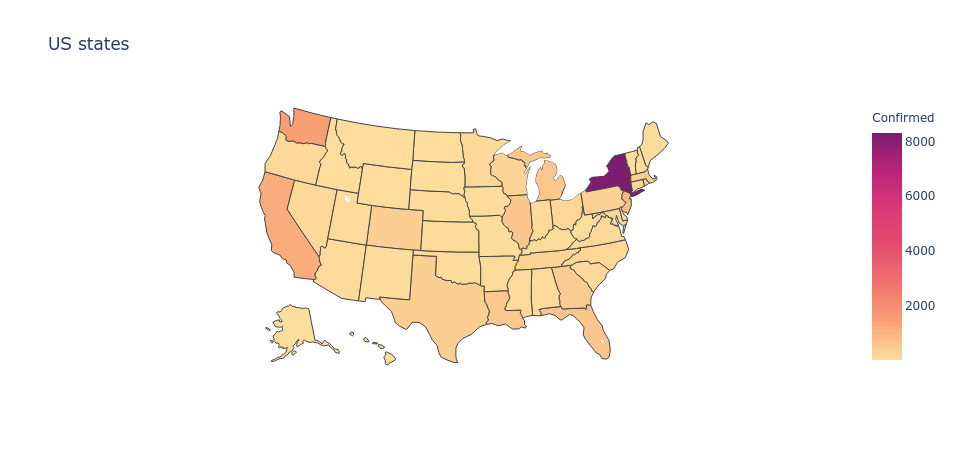

In [24]:

us = full_table[full_table['Country/Region'] == 'US']
us = us[~us['Province/State'].isin(['Diamond Princess', 'Grand Princess'])]

us_latest = us[us['ObservationDate']==max(us['ObservationDate'])]
us_latest['Code'] = us['Province/State'].map(states)

fig = px.choropleth(us_latest, locations='Code', locationmode="USA-states", color='Confirmed', scope="usa", color_continuous_scale="Sunsetdark", 
                   hover_data = ['Province/State', 'Confirmed', 'Deaths', 'Recovered'], title='US states')
fig.show()


In [25]:

temp = ship[ship['ObservationDate']==max(ship['ObservationDate'])]
temp = temp[['Province/State', 'Confirmed', 'Deaths', 'Recovered']].groupby('Province/State').sum().reset_index()
temp.style.background_gradient(cmap='Pastel1_r')


,Province/State,Confirmed,Deaths,Recovered
0,Grand Princess,33.000000,0.000000,0.000000


In [26]:
'''
temp = ship[ship['ObservationDate']==max(ship['ObservationDate'])]

m = folium.Map(location=[0, 0], tiles='cartodbpositron',
               min_zoom=1, max_zoom=4, zoom_start=1)

for i in range(0, len(temp)):
    folium.Circle(
        location=[temp.iloc[i]['Lat'], temp.iloc[i]['Long']],
        color='crimson', 
        tooltip =   '<li><bold>Country : '+str(temp.iloc[i]['Country/Region'])+
                    '<li><bold>Province : '+str(temp.iloc[i]['Province/State'])+
                    '<li><bold>Confirmed : '+str(temp.iloc[i]['Confirmed'])+
                    '<li><bold>Deaths : '+str(temp.iloc[i]['Deaths'])+
                    '<li><bold>Recovered : '+str(temp.iloc[i]['Recovered']),
        radius=100000).add_to(m)
m
'''

"\ntemp = ship[ship['ObservationDate']==max(ship['ObservationDate'])]\n\nm = folium.Map(location=[0, 0], tiles='cartodbpositron',\n               min_zoom=1, max_zoom=4, zoom_start=1)\n\nfor i in range(0, len(temp)):\n    folium.Circle(\n        location=[temp.iloc[i]['Lat'], temp.iloc[i]['Long']],\n        color='crimson', \n        tooltip =   '<li><bold>Country : '+str(temp.iloc[i]['Country/Region'])+\n                    '<li><bold>Province : '+str(temp.iloc[i]['Province/State'])+\n                    '<li><bold>Confirmed : '+str(temp.iloc[i]['Confirmed'])+\n                    '<li><bold>Deaths : '+str(temp.iloc[i]['Deaths'])+\n                    '<li><bold>Recovered : '+str(temp.iloc[i]['Recovered']),\n        radius=100000).add_to(m)\nm\n"

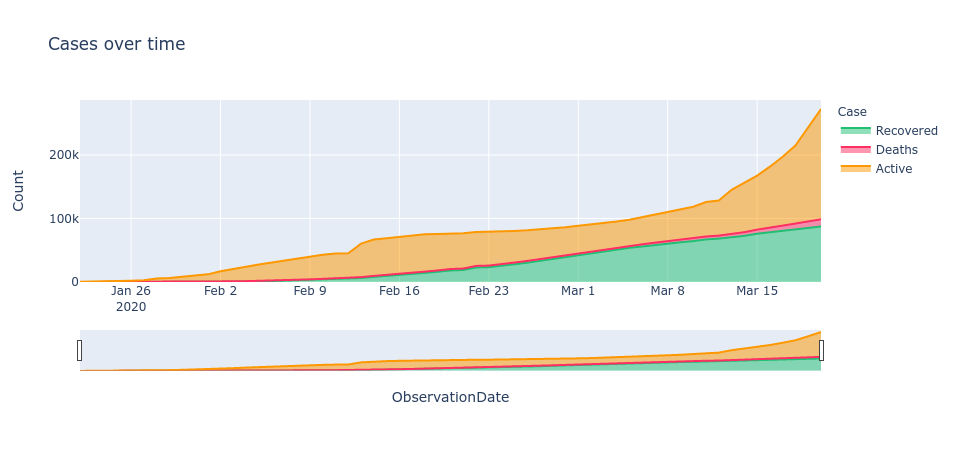

In [27]:

temp = full_table.groupby('ObservationDate')['Recovered', 'Deaths', 'Active'].sum().reset_index()
temp = temp.melt(id_vars="ObservationDate", value_vars=['Recovered', 'Deaths', 'Active'],
                 var_name='Case', value_name='Count')
temp.head()

fig = px.area(temp, x="ObservationDate", y="Count", color='Case',
             title='Cases over time', color_discrete_sequence = [rec, dth, act])
fig.update_layout(xaxis_rangeslider_visible=True)
fig.show()


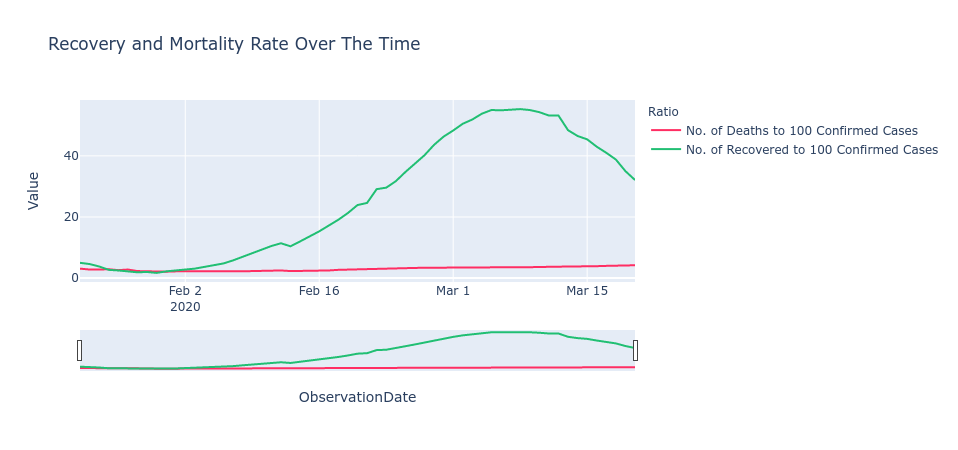

In [28]:

temp = full_table.groupby('ObservationDate').sum().reset_index()

temp['No. of Deaths to 100 Confirmed Cases'] = round(temp['Deaths']/temp['Confirmed'], 3)*100
temp['No. of Recovered to 100 Confirmed Cases'] = round(temp['Recovered']/temp['Confirmed'], 3)*100

temp = temp.melt(id_vars='ObservationDate', 
                 value_vars=['No. of Deaths to 100 Confirmed Cases', 
                             'No. of Recovered to 100 Confirmed Cases'], 
                 var_name='Ratio', value_name='Value')

fig = px.line(temp, x="ObservationDate", y="Value", color='Ratio',  
              title='Recovery and Mortality Rate Over The Time', color_discrete_sequence=[dth, rec])
fig.update_layout(xaxis_rangeslider_visible=True)
fig.show()


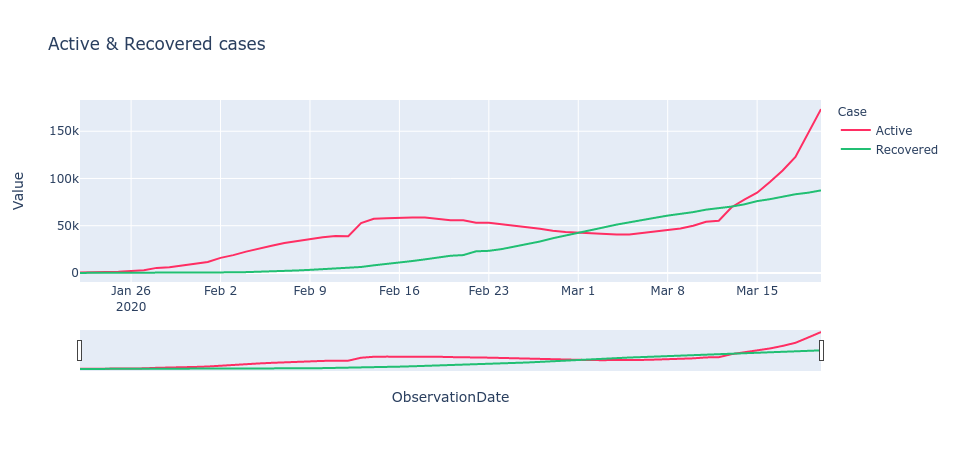

In [29]:

temp = full_table.groupby('ObservationDate').sum().reset_index()

temp = temp.melt(id_vars='ObservationDate', value_vars=['Active', 'Recovered'], 
                 var_name='Case', value_name='Value')

fig = px.line(temp, x="ObservationDate", y="Value", color='Case',  
              title='Active & Recovered cases', color_discrete_sequence=[dth, rec])
fig.update_layout(xaxis_rangeslider_visible=True)
fig.show()


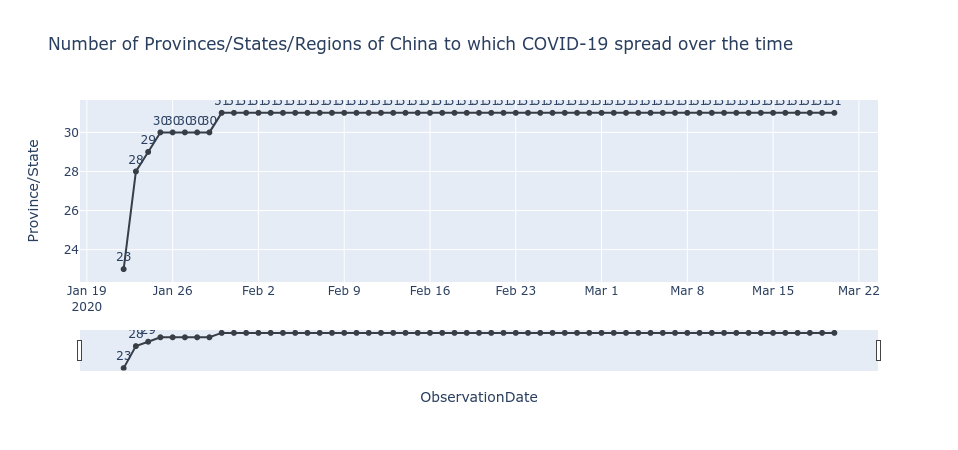

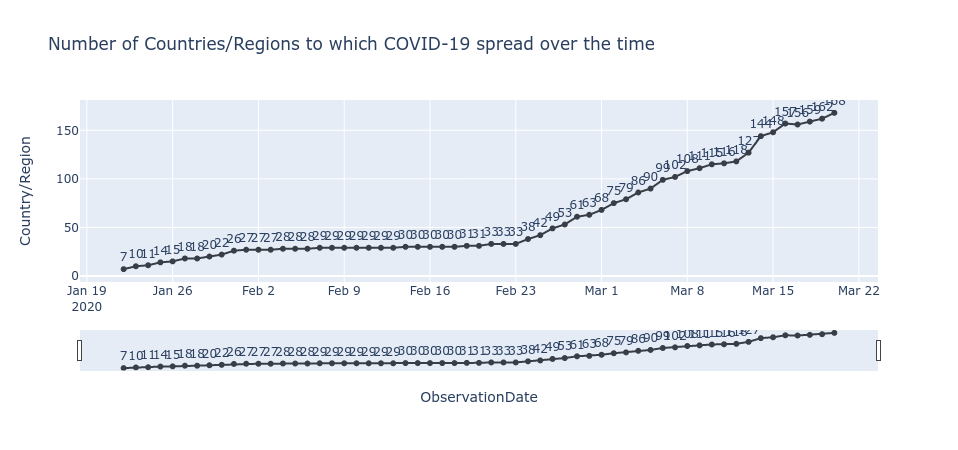

In [30]:

c_spread = china[china['Confirmed']!=0].groupby('ObservationDate')['Province/State'].unique().apply(len)
c_spread = pd.DataFrame(c_spread).reset_index()

fig = px.line(c_spread, x='ObservationDate', y='Province/State', text='Province/State',
              title='Number of Provinces/States/Regions of China to which COVID-19 spread over the time', 
              color_discrete_sequence=[cnf,dth, rec])
fig.update_layout(xaxis_rangeslider_visible=True)
fig.update_traces(textposition='top center')
fig.show()


spread = full_table[full_table['Confirmed']!=0].groupby('ObservationDate')['Country/Region'].unique().apply(len)
spread = pd.DataFrame(spread).reset_index()

fig = px.line(spread, x='ObservationDate', y='Country/Region', text='Country/Region',
              title='Number of Countries/Regions to which COVID-19 spread over the time',
              color_discrete_sequence=[cnf,dth, rec])
fig.update_layout(xaxis_rangeslider_visible=True)
fig.update_traces(textposition='top center')
fig.show()


In [31]:

flg = full_latest_grouped
flg.head()


,Country/Region,Confirmed,Deaths,Recovered,Active
0,Afghanistan,24.0,0.0,1.0,23.0
1,Albania,70.0,2.0,0.0,68.0
2,Algeria,90.0,11.0,32.0,47.0
3,Andorra,75.0,0.0,1.0,74.0
4,Angola,1.0,0.0,0.0,1.0


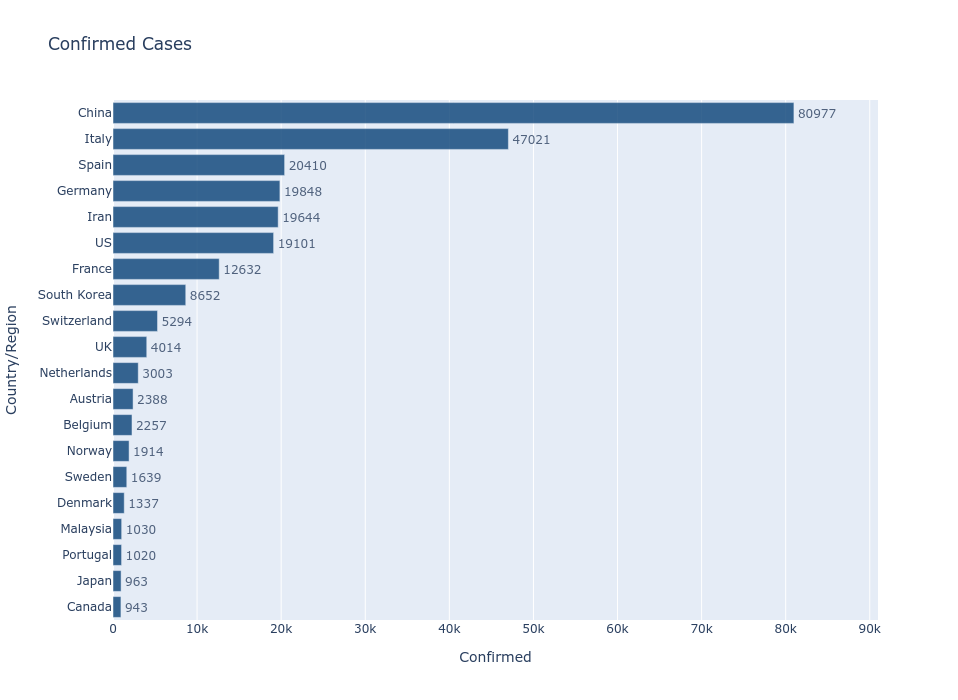

In [32]:

fig = px.bar(flg.sort_values('Confirmed', ascending=False).head(20).sort_values('Confirmed', ascending=True), 
             x="Confirmed", y="Country/Region", title='Confirmed Cases', text='Confirmed', orientation='h', 
             width=700, height=700, range_x = [0, max(flg['Confirmed'])+10000])
fig.update_traces(marker_color='#084177', opacity=0.8, textposition='outside')
fig.show()


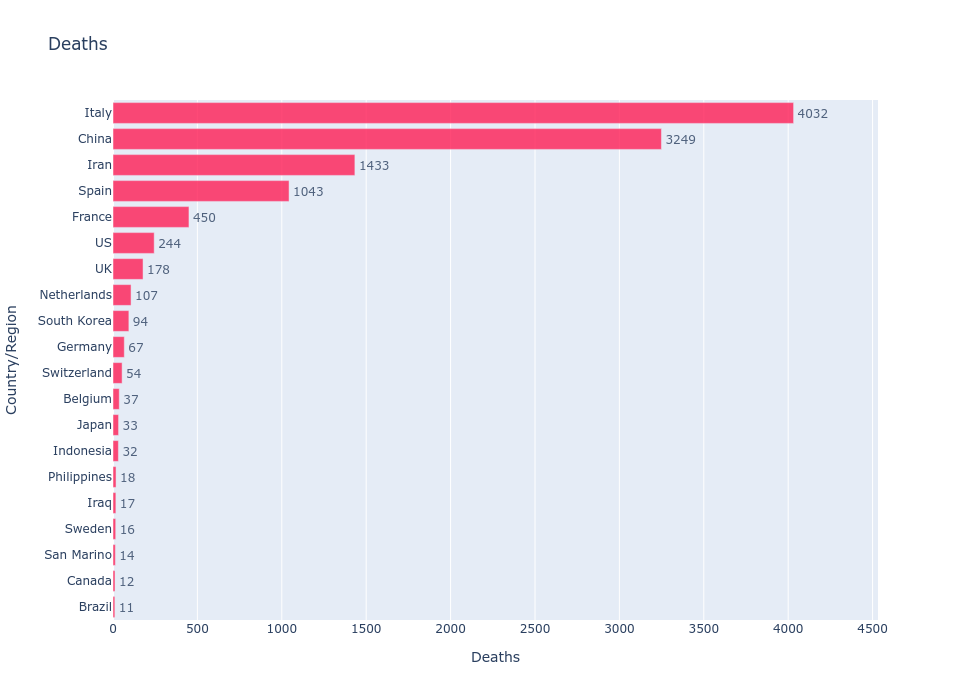

In [33]:

fig = px.bar(flg.sort_values('Deaths', ascending=False).head(20).sort_values('Deaths', ascending=True), 
             x="Deaths", y="Country/Region", title='Deaths', text='Deaths', orientation='h', 
             width=700, height=700, range_x = [0, max(flg['Deaths'])+500])
fig.update_traces(marker_color='#ff1e56', opacity=0.8, textposition='outside')
fig.show()


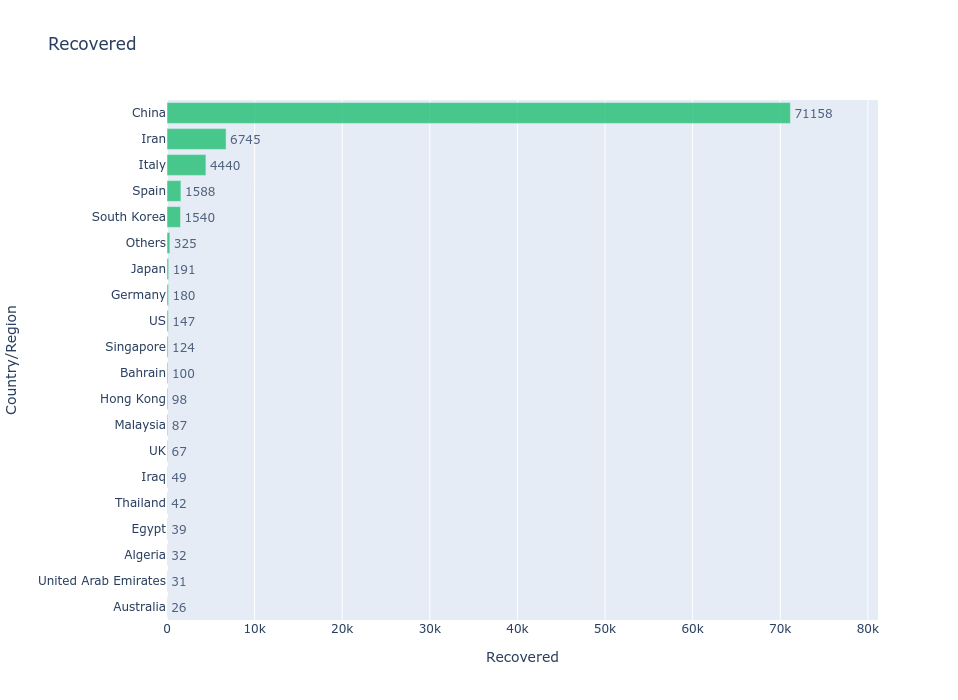

In [34]:

fig = px.bar(flg.sort_values('Recovered', ascending=False).head(20).sort_values('Recovered', ascending=True), 
             x="Recovered", y="Country/Region", title='Recovered', text='Recovered', orientation='h', 
             width=700, height=700, range_x = [0, max(flg['Recovered'])+10000])
fig.update_traces(marker_color=rec, opacity=0.8, textposition='outside')
fig.show()


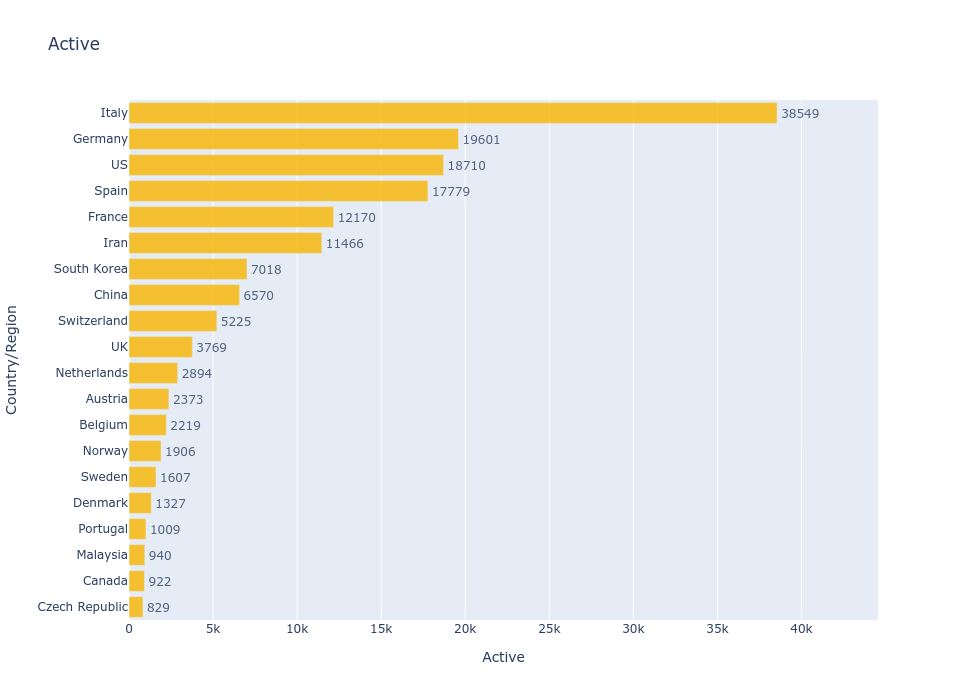

In [35]:

fig = px.bar(flg.sort_values('Active', ascending=False).head(20).sort_values('Active', ascending=True), 
             x="Active", y="Country/Region", title='Active', text='Active', orientation='h', 
             width=700, height=700, range_x = [0, max(flg['Active'])+6000])
fig.update_traces(marker_color='#f8b400', opacity=0.8, textposition='outside')
fig.show()


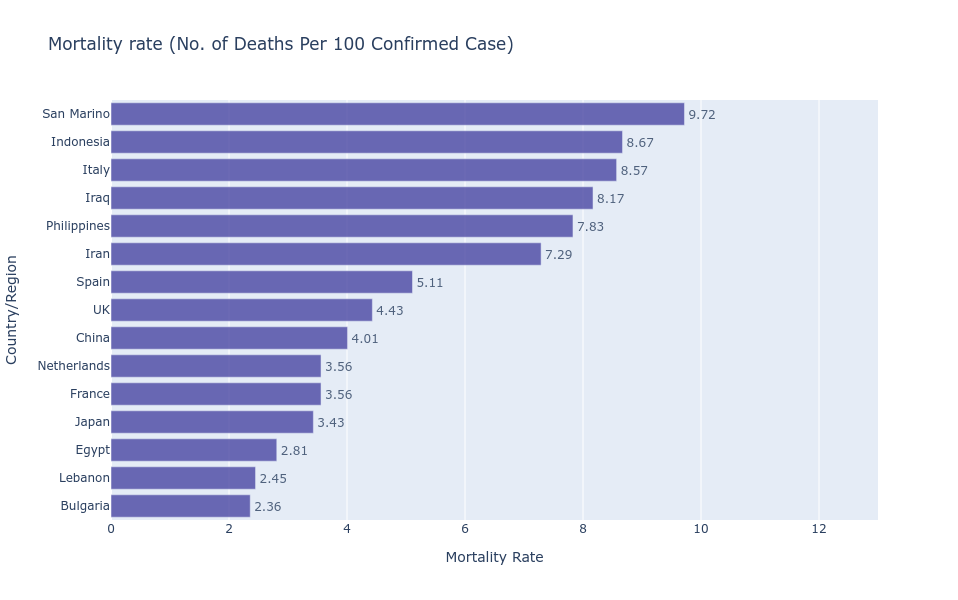

In [36]:

flg['Mortality Rate'] = round((flg['Deaths']/flg['Confirmed'])*100, 2)
temp = flg[flg['Confirmed']>100]
temp = temp.sort_values('Mortality Rate', ascending=False)

fig = px.bar(temp.sort_values('Mortality Rate', ascending=False).head(15).sort_values('Mortality Rate', ascending=True), 
             x="Mortality Rate", y="Country/Region", text='Mortality Rate', orientation='h', 
             width=700, height=600, range_x = [0, 13], title='Mortality rate (No. of Deaths Per 100 Confirmed Case)')
fig.update_traces(marker_color='#4a47a3', opacity=0.8, textposition='outside')
fig.show()


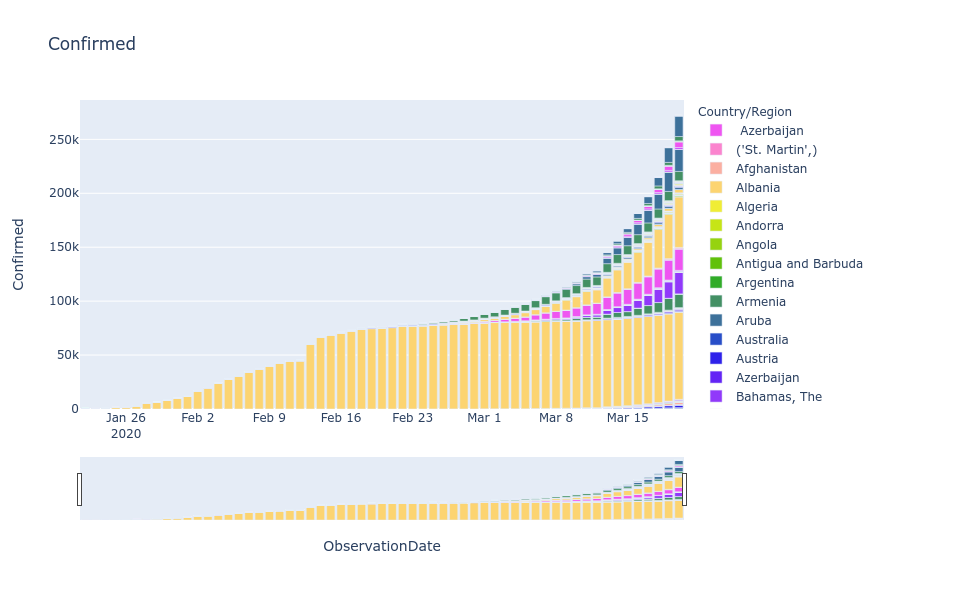

In [37]:

temp = full_table.groupby(['Country/Region', 'ObservationDate'])['Confirmed', 'Deaths', 'Recovered'].sum()
temp = temp.reset_index()

fig = px.bar(temp, x="ObservationDate", y="Confirmed", color='Country/Region', orientation='v', height=600,
             title='Confirmed', color_discrete_sequence = px.colors.cyclical.mygbm)
fig.update_layout(xaxis_rangeslider_visible=True)
fig.show()


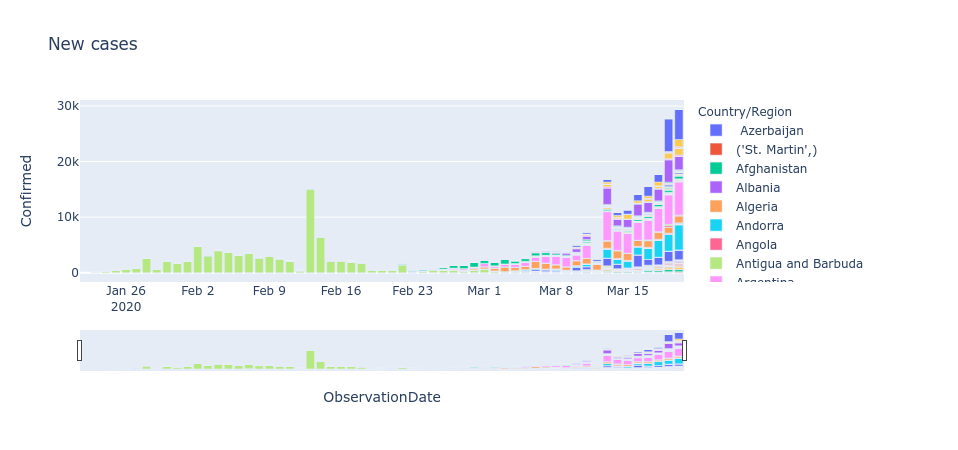

In [38]:

temp = full_table.groupby(['Country/Region', 'ObservationDate', ])['Confirmed', 'Deaths', 'Recovered']
temp = temp.sum().diff().reset_index()

mask = temp['Country/Region'] != temp['Country/Region'].shift(1)

temp.loc[mask, 'Confirmed'] = np.nan
temp.loc[mask, 'Deaths'] = np.nan
temp.loc[mask, 'Recovered'] = np.nan

fig = px.bar(temp, x="ObservationDate", y="Confirmed", color='Country/Region',title='New cases')
fig.update_layout(xaxis_rangeslider_visible=True)
fig.show()


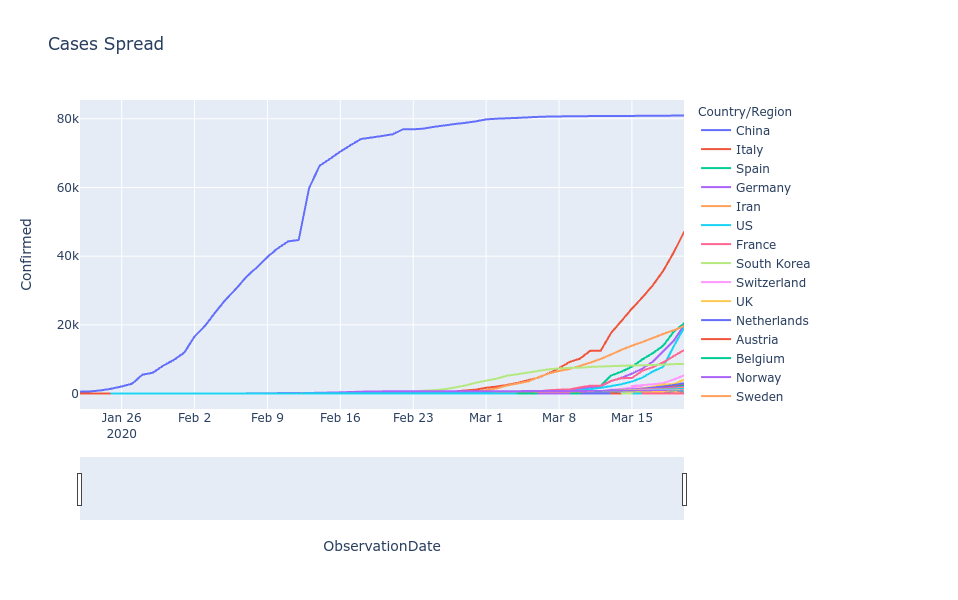

In [39]:

temp = full_table.groupby(['ObservationDate', 'Country/Region'])['Confirmed'].sum().reset_index().sort_values('Confirmed', ascending=False)

fig = px.line(temp, x="ObservationDate", y="Confirmed", color='Country/Region', title='Cases Spread', height=600)
fig.update_layout(xaxis_rangeslider_visible=True)
fig.show()


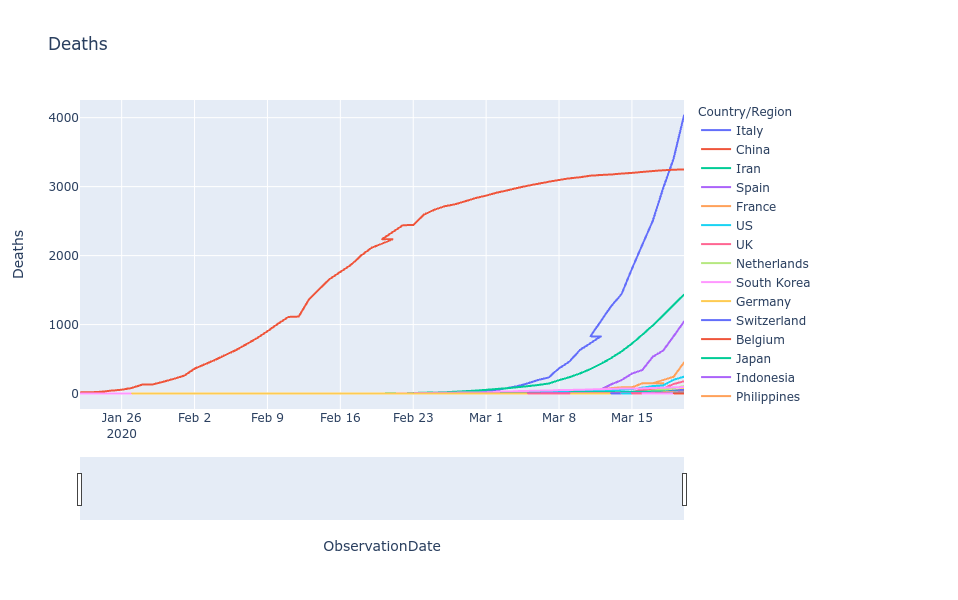

In [40]:

temp = full_table.groupby(['ObservationDate', 'Country/Region'])['Deaths'].sum().reset_index().sort_values('Deaths', ascending=False)

fig = px.line(temp, x="ObservationDate", y="Deaths", color='Country/Region', title='Deaths', height=600)
fig.update_layout(xaxis_rangeslider_visible=True)
fig.show()


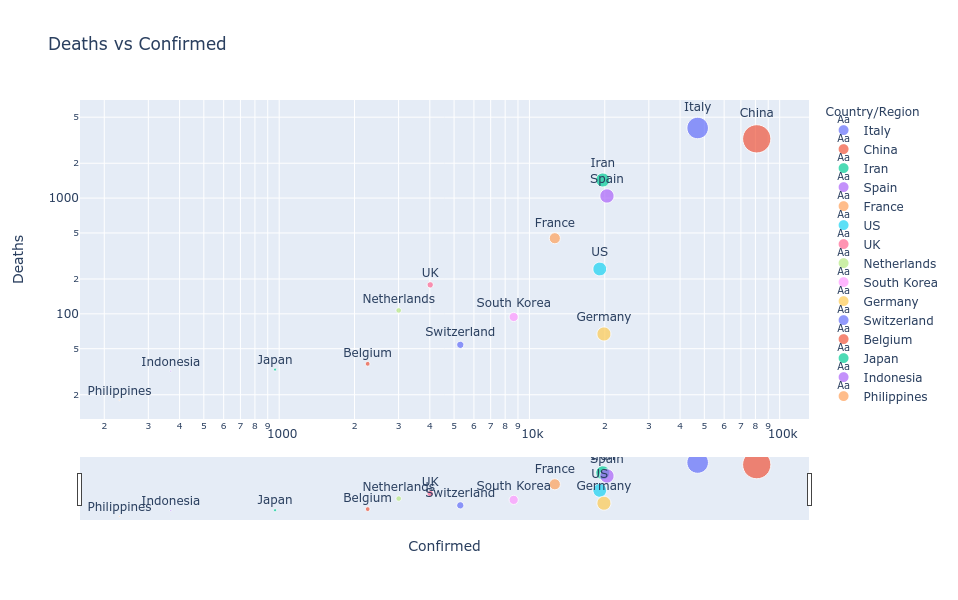

In [41]:

fig = px.scatter(full_latest_grouped.sort_values('Deaths', ascending=False).iloc[:15, :], 
                 x='Confirmed', y='Deaths', color='Country/Region', size='Confirmed', height=600,
                 text='Country/Region', log_x=True, log_y=True, title='Deaths vs Confirmed')
fig.update_traces(textposition='top center')
fig.update_layout(xaxis_rangeslider_visible=True)
fig.show()


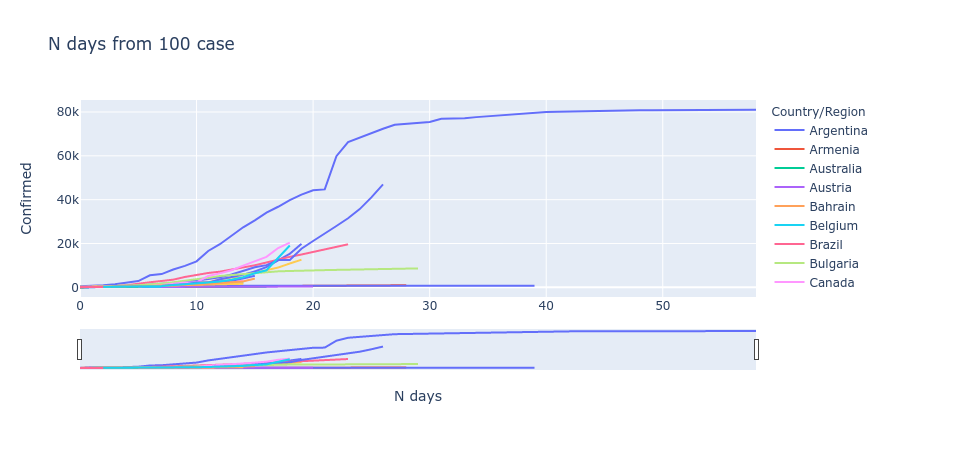

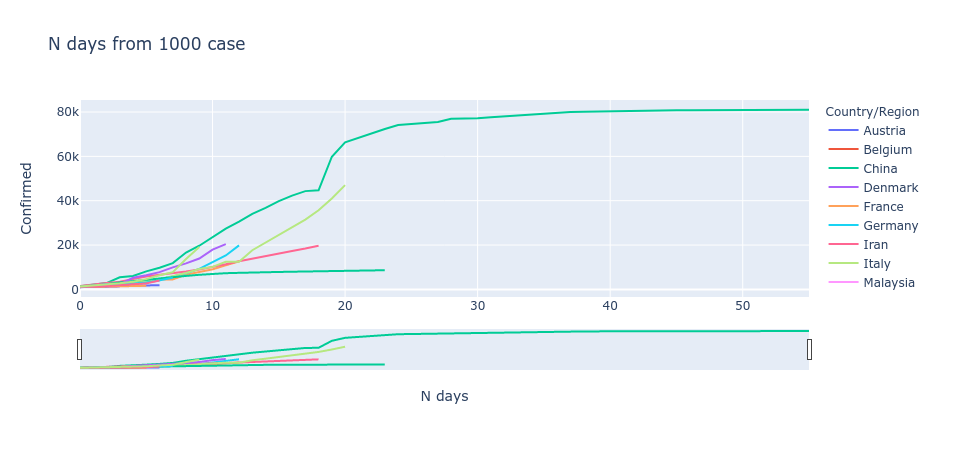

In [42]:

gt_100 = full_latest_grouped[full_latest_grouped['Confirmed']>100]['Country/Region'].unique()
temp = full_table[full_table['Country/Region'].isin(gt_100)]
temp = temp.groupby(['Country/Region', 'ObservationDate'])['Confirmed'].sum().reset_index()
temp = temp[temp['Confirmed']>100]
# print(temp.head())

min_date = temp.groupby('Country/Region')['ObservationDate'].min().reset_index()
min_date.columns = ['Country/Region', 'Min Date']
# print(min_date.head())

from_100th_case = pd.merge(temp, min_date, on='Country/Region')
from_100th_case['N days'] = (from_100th_case['ObservationDate'] - from_100th_case['Min Date']).dt.days
# print(from_100th_case.head())

fig = px.line(from_100th_case, x='N days', y='Confirmed', color='Country/Region', title='N days from 100 case')
fig.update_layout(xaxis_rangeslider_visible=True)
fig.show()

gt_1000 = full_latest_grouped[full_latest_grouped['Confirmed']>1000]['Country/Region'].unique()
temp = full_table[full_table['Country/Region'].isin(gt_1000)]
temp = temp.groupby(['Country/Region', 'ObservationDate'])['Confirmed'].sum().reset_index()
temp = temp[temp['Confirmed']>1000]
# print(temp.head())

min_date = temp.groupby('Country/Region')['ObservationDate'].min().reset_index()
min_date.columns = ['Country/Region', 'Min Date']
# print(min_date.head())

from_1000th_case = pd.merge(temp, min_date, on='Country/Region')
from_1000th_case['N days'] = (from_1000th_case['ObservationDate'] - from_1000th_case['Min Date']).dt.days
# print(from_1000th_case.head())

fig = px.line(from_1000th_case, x='N days', y='Confirmed', color='Country/Region', title='N days from 1000 case')
fig.update_layout(xaxis_rangeslider_visible=True)
fig.show()


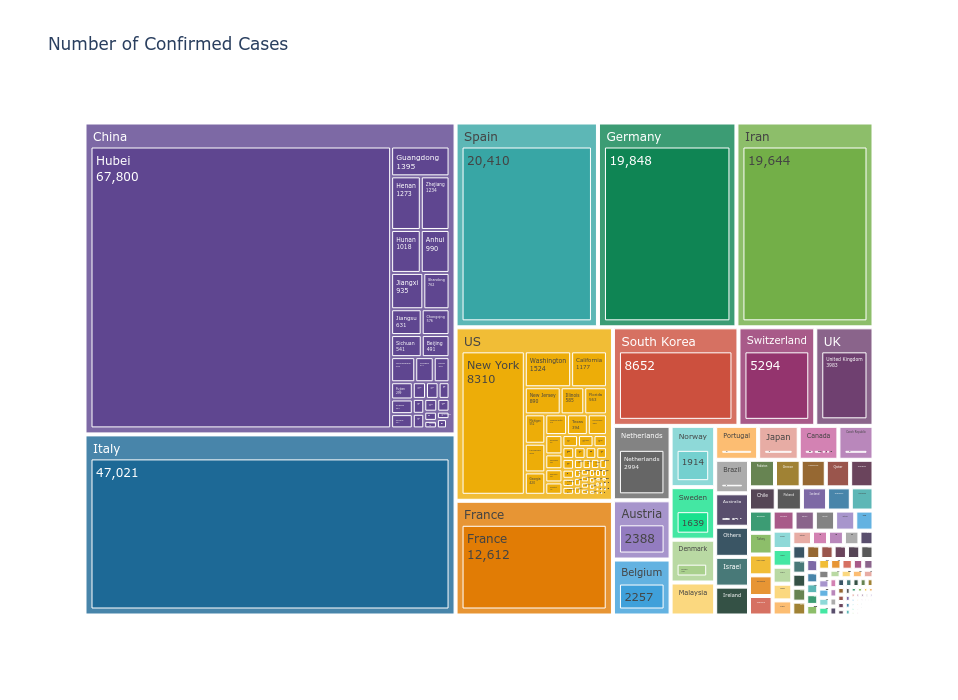

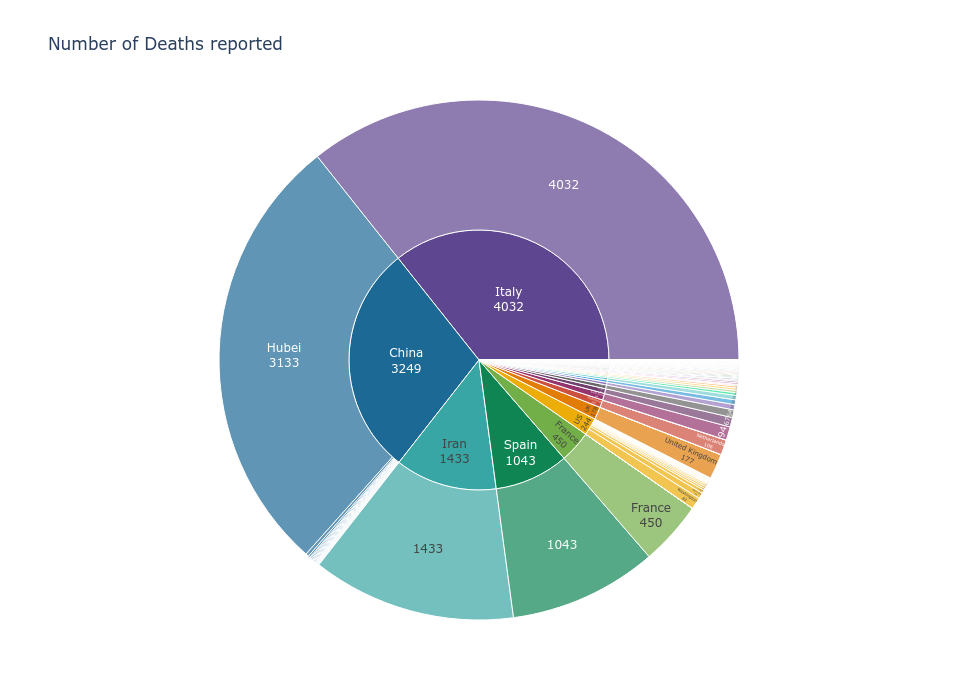

In [43]:

fig = px.treemap(full_latest.sort_values(by='Confirmed', ascending=False).reset_index(drop=True), 
                 path=["Country/Region", "Province/State"], values="Confirmed", height=700,
                 title='Number of Confirmed Cases',
                 color_discrete_sequence = px.colors.qualitative.Prism)
fig.data[0].textinfo = 'label+text+value'
fig.show()

fig = px.sunburst(full_latest.sort_values(by='Deaths', ascending=False).reset_index(drop=True), 
                 path=["Country/Region", "Province/State"], values="Deaths", height=700,
                 title='Number of Deaths reported',
                 color_discrete_sequence = px.colors.qualitative.Prism)
fig.data[0].textinfo = 'label+text+value'
fig.show()


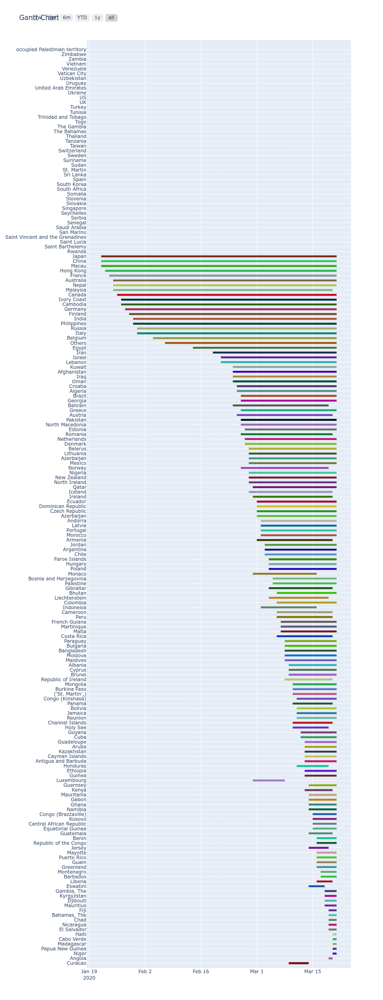

In [44]:

first_date = full_table[full_table['Confirmed']>0]
first_date = first_date.groupby('Country/Region')['ObservationDate'].agg(['min']).reset_index()

from datetime import timedelta  

last_date = full_table.groupby(['Country/Region', 'ObservationDate', ])['Confirmed', 'Deaths', 'Recovered']
last_date = last_date.sum().diff().reset_index()

mask = last_date['Country/Region'] != last_date['Country/Region'].shift(1)
last_date.loc[mask, 'Confirmed'] = np.nan
last_date.loc[mask, 'Deaths'] = np.nan
last_date.loc[mask, 'Recovered'] = np.nan

last_date = last_date[last_date['Confirmed']>0]
last_date = last_date.groupby('Country/Region')['ObservationDate'].agg(['max']).reset_index()

first_last = pd.concat([first_date, last_date[['max']]], axis=1)

first_last['max'] = first_last['max'] + timedelta(days=1)

first_last['Days'] = first_last['max'] - first_last['min']

first_last['Task'] = first_last['Country/Region']

first_last.columns = ['Country/Region', 'Start', 'Finish', 'Days', 'Task']

first_last = first_last.sort_values('Days')

clr = ["#"+''.join([random.choice('0123456789ABC') for j in range(6)]) for i in range(len(first_last))]

fig = ff.create_gantt(first_last, index_col='Country/Region', colors=clr, show_colorbar=False, 
                      bar_width=0.2, showgrid_x=True, showgrid_y=True, height=2500, 
                      title=('Gantt Chart'))
fig.show()


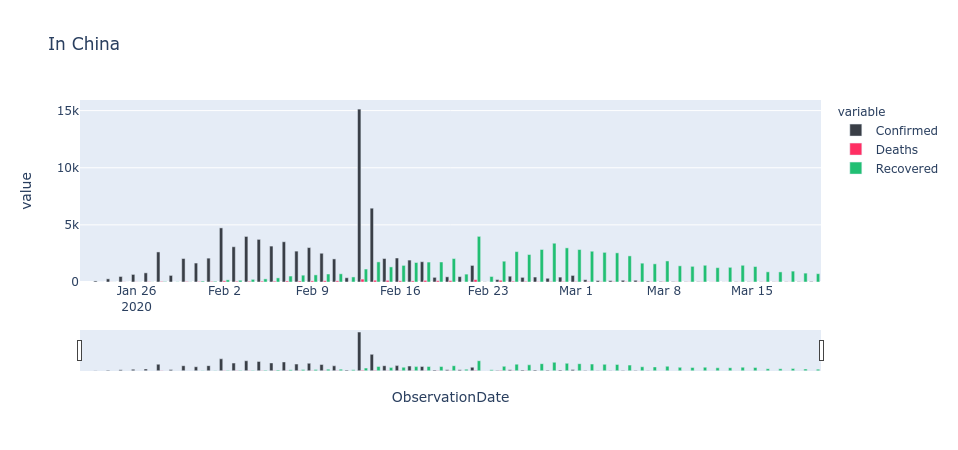

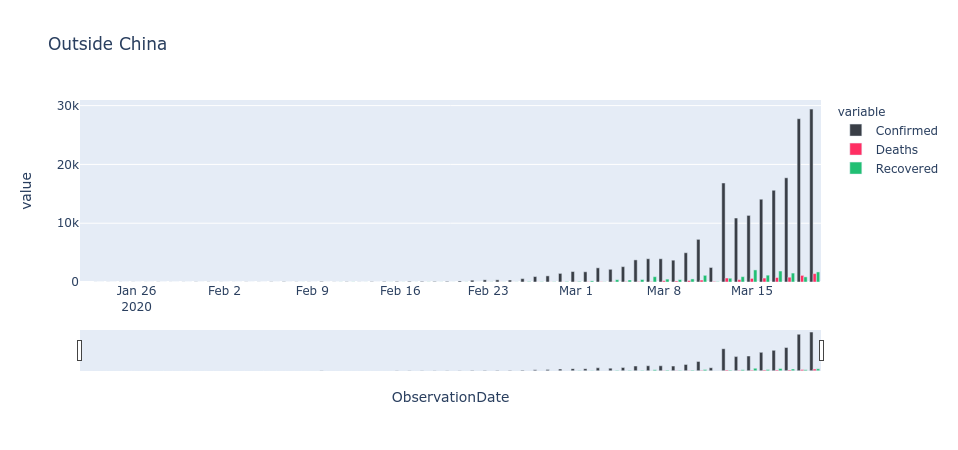

In [45]:

temp = china.groupby('ObservationDate')['Confirmed', 'Deaths', 'Recovered'].sum().diff()
temp = temp.reset_index()
temp = temp.melt(id_vars="ObservationDate", 
                 value_vars=['Confirmed', 'Deaths', 'Recovered'])

fig = px.bar(temp, x="ObservationDate", y="value", color='variable', 
             title='In China',
             color_discrete_sequence=[cnf, dth, rec])
fig.update_layout(barmode='group')
fig.update_layout(xaxis_rangeslider_visible=True)
fig.show()


temp = row.groupby('ObservationDate')['Confirmed', 'Deaths', 'Recovered'].sum().diff()
temp = temp.reset_index()
temp = temp.melt(id_vars="ObservationDate", 
                 value_vars=['Confirmed', 'Deaths', 'Recovered'])

fig = px.bar(temp, x="ObservationDate", y="value", color='variable', 
             title='Outside China',
             color_discrete_sequence=[cnf, dth, rec])
fig.update_layout(barmode='group')
fig.update_layout(xaxis_rangeslider_visible=True)
fig.show()


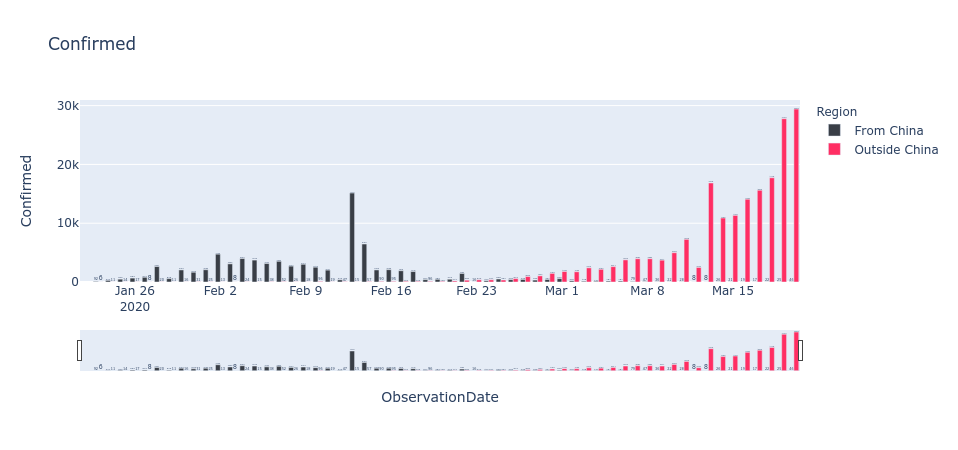

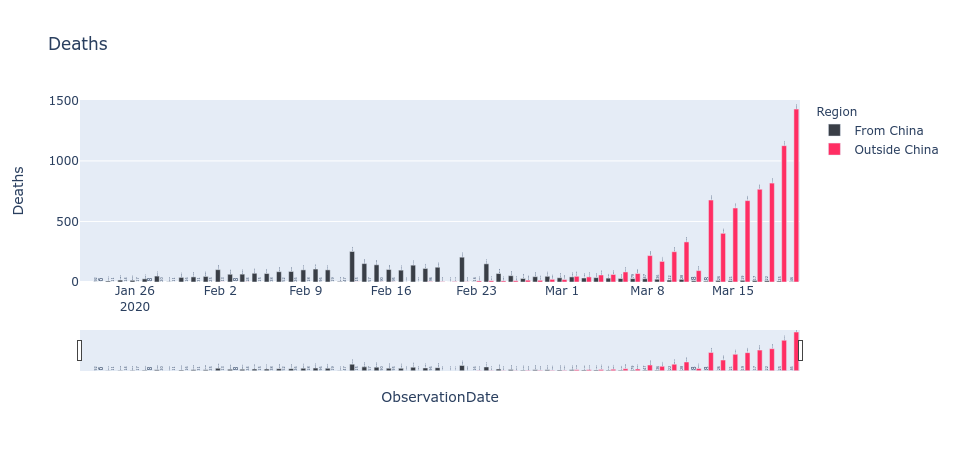

In [46]:

def from_china_or_not(row):
    if row['Country/Region']=='China':
        return 'From China'
    else:
        return 'Outside China'
    
temp = full_table.copy()
temp['Region'] = temp.apply(from_china_or_not, axis=1)
temp = temp.groupby(['Region', 'ObservationDate'])['Confirmed', 'Deaths', 'Recovered']
temp = temp.sum().diff().reset_index()
mask = temp['Region'] != temp['Region'].shift(1)
temp.loc[mask, 'Confirmed'] = np.nan
temp.loc[mask, 'Deaths'] = np.nan
temp.loc[mask, 'Recovered'] = np.nan

fig = px.bar(temp, x='ObservationDate', y='Confirmed', color='Region', barmode='group', 
             text='Confirmed', title='Confirmed', color_discrete_sequence= [cnf, dth, rec])
fig.update_traces(textposition='outside')
fig.update_layout(xaxis_rangeslider_visible=True)
fig.show()

fig = px.bar(temp, x='ObservationDate', y='Deaths', color='Region', barmode='group', 
             text='Confirmed', title='Deaths', color_discrete_sequence= [cnf, dth, rec])
fig.update_traces(textposition='outside')
fig.update_traces(textangle=-90)
fig.update_layout(xaxis_rangeslider_visible=True)
fig.show()


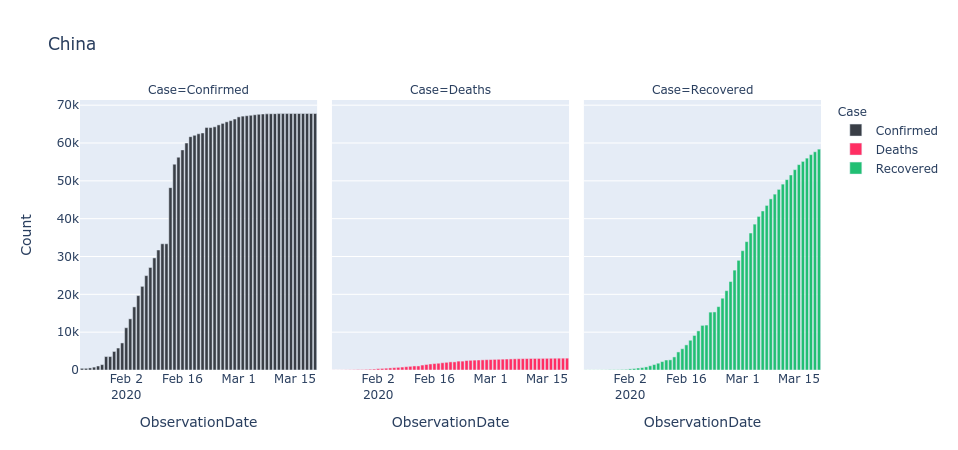

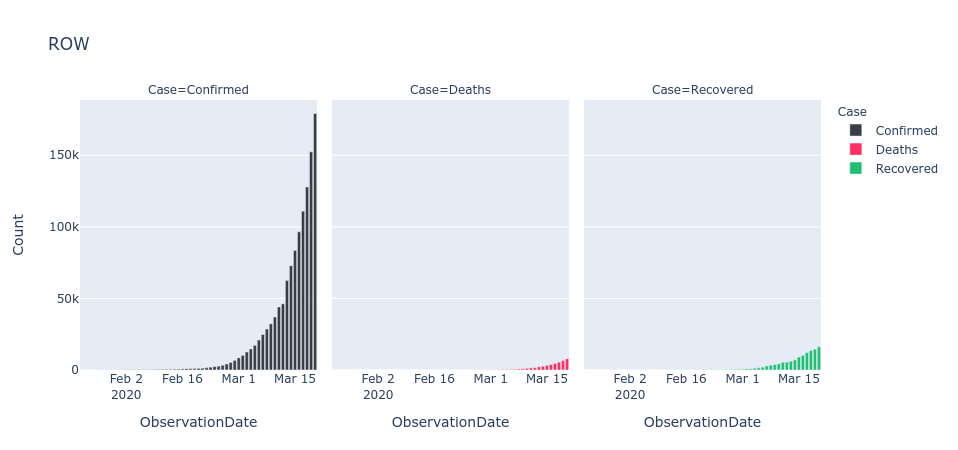

In [47]:

gdf = full_table.groupby(['ObservationDate', 'Country/Region'])['Confirmed', 'Deaths', 'Recovered'].max()
gdf = gdf.reset_index()

temp = gdf[gdf['Country/Region']=='China'].reset_index()
temp = temp.melt(id_vars='ObservationDate', value_vars=['Confirmed', 'Deaths', 'Recovered'],
                var_name='Case', value_name='Count')
fig = px.bar(temp, x="ObservationDate", y="Count", color='Case', facet_col="Case",
            title='China', color_discrete_sequence=[cnf, dth, rec])
fig.show()

temp = gdf[gdf['Country/Region']!='China'].groupby('ObservationDate').sum().reset_index()
temp = temp.melt(id_vars='ObservationDate', value_vars=['Confirmed', 'Deaths', 'Recovered'],
                var_name='Case', value_name='Count')
fig = px.bar(temp, x="ObservationDate", y="Count", color='Case', facet_col="Case",
             title='ROW', color_discrete_sequence=[cnf, dth, rec])
fig.show()


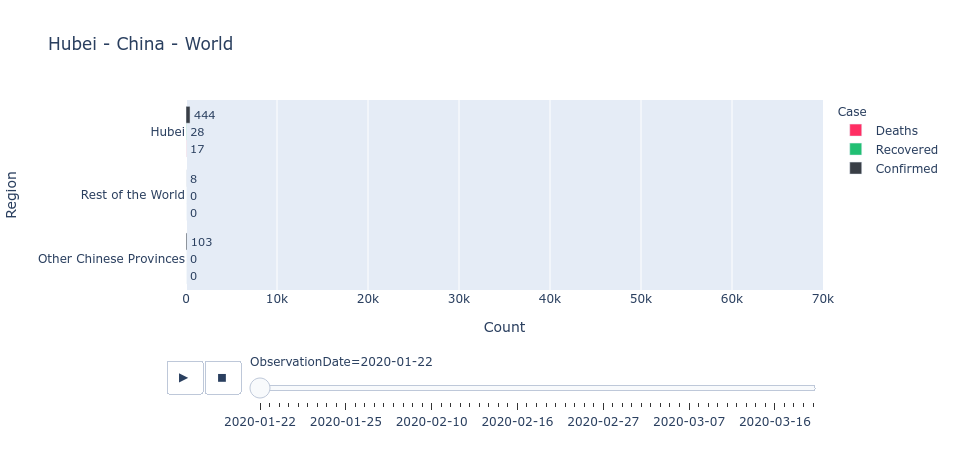

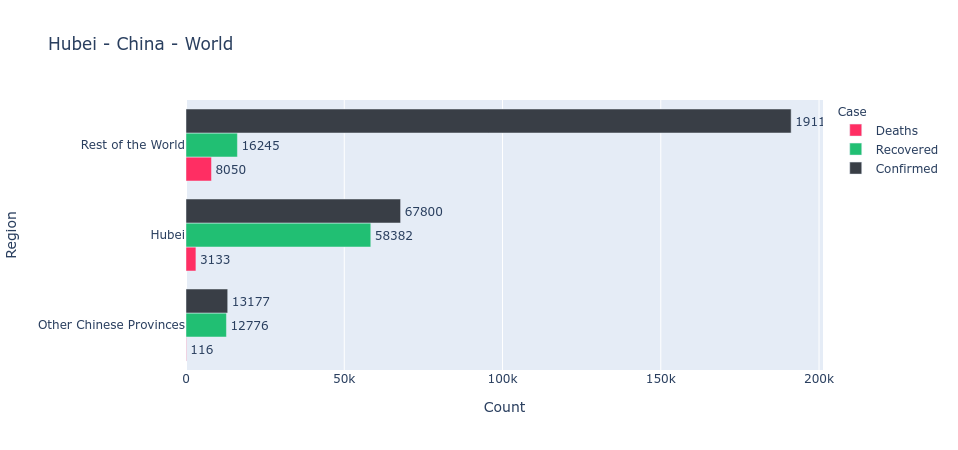

In [48]:

def location(row):
    if row['Country/Region']=='China':
        if row['Province/State']=='Hubei':
            return 'Hubei'
        else:
            return 'Other Chinese Provinces'
    else:
        return 'Rest of the World'

temp = full_table.copy()
temp['Region'] = temp.apply(location, axis=1)
temp['ObservationDate'] = temp['ObservationDate'].dt.strftime('%Y-%m-%d')
temp = temp.groupby(['Region', 'ObservationDate'])['Confirmed', 'Deaths', 'Recovered'].sum().reset_index()
temp = temp.melt(id_vars=['Region', 'ObservationDate'], value_vars=['Confirmed', 'Deaths', 'Recovered'], 
                 var_name='Case', value_name='Count').sort_values('Count')

temp.head()

fig = px.bar(temp, y='Region', x='Count', color='Case', barmode='group', orientation='h',
             text='Count', title='Hubei - China - World', animation_frame='ObservationDate',
             color_discrete_sequence= [dth, rec, cnf], range_x=[0, 70000])
fig.update_traces(textposition='outside')
fig.show()

temp = full_latest.copy()
temp['Region'] = temp.apply(location, axis=1)
temp = temp.groupby('Region')['Confirmed', 'Deaths', 'Recovered'].sum().reset_index()
temp = temp.melt(id_vars='Region', value_vars=['Confirmed', 'Deaths', 'Recovered'], 
                 var_name='Case', value_name='Count').sort_values('Count')
temp.head()

fig = px.bar(temp, y='Region', x='Count', color='Case', barmode='group', orientation='h',
             text='Count', title='Hubei - China - World', 
             color_discrete_sequence= [dth, rec, cnf])
fig.update_traces(textposition='outside')
fig.update_layout(uniformtext_minsize=8, uniformtext_mode='hide')
fig.show()


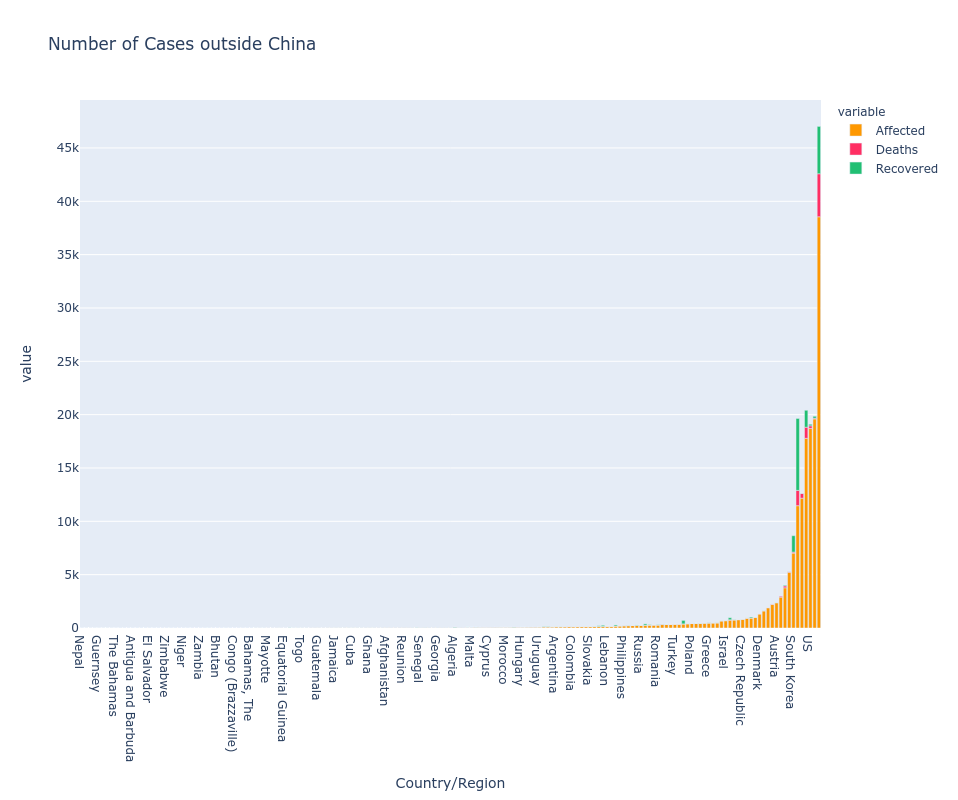

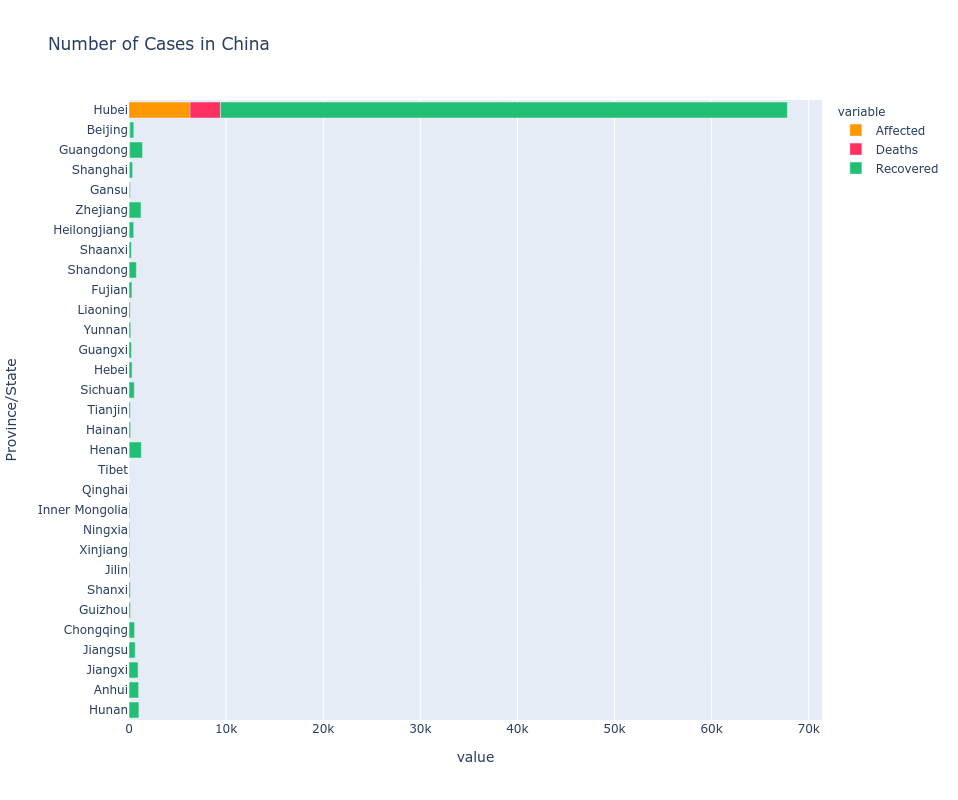

In [49]:

rl = row_latest.groupby('Country/Region')['Confirmed', 'Deaths', 'Recovered'].sum()
rl = rl.reset_index().sort_values(by='Confirmed', ascending=False).reset_index(drop=True)
rl.head().style.background_gradient(cmap='rainbow')

ncl = rl.copy()
ncl['Affected'] = ncl['Confirmed'] - ncl['Deaths'] - ncl['Recovered']
ncl = ncl.melt(id_vars="Country/Region", value_vars=['Affected', 'Recovered', 'Deaths'])

fig = px.bar(ncl.sort_values(['variable', 'value']), 
             x="Country/Region", y="value", color='variable', orientation='v', height=800,
             title='Number of Cases outside China', color_discrete_sequence=[act, dth, rec])
fig.update_layout(uniformtext_minsize=8, uniformtext_mode='hide')
fig.show()


cl = china_latest.groupby('Province/State')['Confirmed', 'Deaths', 'Recovered'].sum()
cl = cl.reset_index().sort_values(by='Confirmed', ascending=False).reset_index(drop=True)

ncl = cl.copy()
ncl['Affected'] = ncl['Confirmed'] - ncl['Deaths'] - ncl['Recovered']
ncl = ncl.melt(id_vars="Province/State", value_vars=['Affected', 'Recovered', 'Deaths'])

fig = px.bar(ncl.sort_values(['variable', 'value']), 
             y="Province/State", x="value", color='variable', orientation='h', height=800,
             title='Number of Cases in China', color_discrete_sequence=[act, dth, rec])
fig.update_layout(uniformtext_minsize=8, uniformtext_mode='hide')
fig.show()
